<a href="https://colab.research.google.com/github/turkin501/CS116.M11.KHTN/blob/main/final_project/RandomForestRegression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Random Forest Regression

## 1. Decision Tree


### 1.1. Decision tree là gì (ý tưởng, khái niệm)

Trong cuộc sống, có những lúc chúng ta cần phải đưa ra quyết định việc gì đó. Ví dụ như khi đi chợ, bạn cần phải quyết định xem mua bao nhiêu kg gạo là đủ cho cả gia đình. Bạn cần phải xác định thường ngày thì gia đình bạn sẽ sử dụng hết bao nhiêu kg gạo. Như vậy, dựa theo lượng gạo đã dùng trong ngày cho số người trong gia đình bạn (đặc trưng được cho là quan trọng nhất), bạn sẽ quyết định lượng gạo cần mua cho gia đình bạn. Đó chính là một dạng của cây quyết định.

Cây quyết định là một công cụ hỗ trợ quyết định sử dụng mô hình quyết định dạng cây và các hệ quả có thể xảy ra của chúng, bao gồm cả kết quả sự kiện may rủi và chi phí tài nguyên. Trong đó mỗi nút bên trong biểu thị một phép thử trên một thuộc tính, mỗi nhánh biểu thị một kết quả của phép thử và mỗi nút lá (nút đầu cuối) chứa một nhãn lớp. Nói cách khác, cây quyết định biểu diễn thuật toán chỉ chứa các câu lệnh điều khiển có điều kiện (if - else).

Khác với những thuật toán khác trong học có giám sát (supervised learning), mô hình cây quyết định không tồn tại phương trình dự báo. Mọi việc chúng ta cần thực hiện đó là tìm ra một cây quyết định dự báo tốt trên tập huấn luyện và sử dụng cây quyết định này dự báo trên tập kiểm tra.

### 1.2. Cách xây dựng decision tree

 Khi xây dựng một cây quyết định, thứ ta cần quan tâm đó là tạo các nhánh như thế nào, thứ tự của chúng ra sao.
Áp dụng chúng vào các thuộc tính, ta cần phải xác định điểm phân chia của mỗi thuộc tính và thuộc tính nào chúng ta xét trước, thuộc tính nào chúng ta xét sau. Trả lời cho câu hỏi thứ nhất, với thuộc tính có các biến rời rạc (discrete) ta tìm xem nó sẽ nằm ở biến nào, với thuộc tính có các biến liên tục (continuous) ta tìm xem điểm phân chia nằm ở khoảng giá trị nào. \\
Dù là thuộc tính loại nào chúng ta đều nhắm đến mục đích đạt được đó là tìm ra thuộc tính và điểm phân nhánh mà tại đó cho infomation gain lớn nhất, và information gain max thường tương đương với MSE min (độ lệch chuẩn nhỏ nhất). Và tiếp tục làm theo cách chọn như vậy lần lượt đến các thuộc tính tiếp theo theo cách chọn tham lam (Greedy).  

Như vậy, trong xây dựng một cây quyết định, ta lặp lại hành động sau liên tục:
- Đi từ trên xuống (top-down), lần lượt tính độ lệch chuẩn. Từ thuộc tính có độ lệch chuẩn nhỏ nhất tại đó, tiến hành phân nhánh. 

Nếu cứ tiếp tục xây cây như vậy thì đến cuối cùng mọi điểm trong tập huấn luyện đều sẽ được dự đoán đúng. Khi đó cây của chúng ta sẽ trở nên vô cùng lớn và có kết cấu vô cùng phức tạp với nhiều node lá chỉ có vài điểm dữ liệu trên đó. Lúc này, sẽ rất dễ xảy ra hiện tượng overfit. Để tránh hiện tượng overfit, tùy vào từng thuật toán khác nhau, sẽ có điều kiện dừng hoặc những cách cắt tỉa khác biệt. 

Sau đây chúng ta sẽ cùng đi qua ví dụ sau để làm rõ cách xây dựng một cây hồi quy quyết định:

In [ ]:
df['price'] = df['selling_price']/1000
df['driven'] = df['km_driven']/1000
sample = df.loc[:14,['owner', 'driven', 'fuel', 'price']]
sample

,owner,driven,fuel,price
0,First Owner,145.5,Diesel,450.0
1,Second Owner,120.0,Diesel,370.0
2,Third Owner,140.0,Petrol,158.0
3,First Owner,127.0,Diesel,225.0
4,First Owner,120.0,Petrol,130.0
5,First Owner,45.0,Petrol,440.0
6,First Owner,175.0,LPG,96.0
7,Second Owner,5.0,Petrol,45.0
8,First Owner,90.0,Diesel,350.0
9,First Owner,169.0,Diesel,200.0


Giả sử chúng ta có bộ dữ liệu như trên với 2 cột thuộc tính dữ liệu có dạng categories và một cột thuộc tính có dạng số thực, cột mục tiêu có dạng số thực. Tiến hành xây cây hồi quy quyết định trên tập dữ liệu này.

*Trong ví dụ này ta tìm information gain của thuộc tính dựa theo squared error và chọn đặc tính bằng cách so sánh standard deviation reduction*

#### **Dataset**:

Price: $450.0, 370.0, 158.0, 225.0, 130.0, 440.0,  96.0,  45.0, 350.0, 200.0, 500.0, 92.0, 280.0, 200.0$ \
Average Price: $(450.0+370.0+158.0+225.0+130.0+440.0+ 96.0+ 45.0+350.0+200.0+500.0+92.0+280.0+200.0)/15 = 235.73$ \
Standard deviation of Price: $\sqrt{((450.0-235.73)^2 +(370.0-235.73)^2 +(158.0-235.73)^2 +(225.0-235.73)^2 +(130.0-235.73)^2 +(440.0-235.73)^2 +( 96.0-235.73)^2 +( 45.0-235.73)^2 +(350.0-235.73)^2 +(200.0-235.73)^2 +(500.0-235.73)^2 +(92.0-235.73)^2 +(280.0-235.73)^2 +(200.0-235.73)^2)/15} = 138.32$



**Cột owner**:

- *First Owner* 

| owner       |driven | fuel   | price |
| ---         |  ---  |  ---   |  ---- |
| First Owner | 145.5 | Diesel | 450.0 |
| First Owner | 127.0 | Diesel | 225.0 |
| First Owner | 120.0 | Petrol | 130.0 |
| First Owner | 45.0  | Petrol | 440.0 |
| First Owner | 175.0 | LPG    | 96.0  |
| First Owner | 90.0  | Diesel | 350.0 |
| First Owner | 169.0 | Diesel | 200.0 |

Price of First Owner: $450.0, 225.0, 130.0, 440.0, 96.0, 350.0, 200.0$ \
Average price of First Owner: $(450.0+225.0+130.0+440.0+96.0+350.0+200.0)/7 = 270.14$ \
Standard deviation (độ lệch chuẩn) for First Owner: $\sqrt{((450-270.14)^2+(225-270.14)^2+(130-270.14)^2+(440-270.14)^2+(96-270.14)^2+(350-270.14)^2+(200-270.14)^2)/7} = 133.36$

- *Second Owner* 

| owner       |driven | fuel   | price |
| ---         |  ---  |  ---   |  ---- |
| Second Owner| 120.0 | Diesel | 370.0 |
| Second Owner| 5.0   | Petrol | 45.0  |
| Second Owner| 68.0  | Diesel | 500.0 |
| Second Owner| 100.0 | Petrol | 92.0  |
| Second Owner| 140.0 | Diesel | 280.0 |
| Second Owner| 80.0  | Petrol | 200.0 |
| Second Owner| 90.0  | Petrol | 180.0 |

Price of Second Owner: $370.0, 45.0, 500.0, 92.0, 280.0, 200.0, 180.0$ \
Average price of Second Owner: $(370.0+45.0+500.0+92.0+280.0+200.0+180.0)/7 = 238.14$ \ 
Standard deviation for Second Owner: $\sqrt{((370-238.14)^2+(45-238.14)^2+(500-238.14)^2+(92-238.14)^2+(280-238.14)^2+(200-238.14)^2+(180-238.14)^2)/7} = 146.97$

- *Third Owner* 

| owner       |driven | fuel   | price |
| ---         |  ---  |  ---   |  ---- | 
| Third Owner | 140.0 | Petrol | 158.0 |

Price for Third Owner: $158.0$ \
Average price for Third Owner: $158.0$ \
Stand deviation for Third Owner: $0$

- *Summarizing SD for owner*

| owner       |StDev  |instances| 
| ---------   |  ---- |  ---    |   
| First Owner | 133.36|   7     |
| Second Owner| 146.97|   7     |
| Third Owner |   0   |   1     |

Weighted standard deviation on owner: $(7/15)*133.36 + (7/15)*146.97 + 0*1 = 130.82$ \
Standard deviation reduction on owner: $138.32 - 130.82 = 7.5$

**Cột driven**:

- $5.0$:
    - $x_{driven} > 5.0$: \
    Price: $450.0, 370.0, 158.0, 225.0, 130.0, 440.0,  96.0, 350.0, 200.0, 500.0, 92.0, 280.0, 200.0, 180.0$
    $mean_{x_{driven}>5.0} = (450.0+370.0+158.0+225.0+130.0+440.0+ 96.0+350.0+200.0+500.0+92.0+280.0+200.0+180.0)/14 = 262.21$
    $MSE_{x_{driven}>5.0} =  \sqrt{((450.0-252.57)^2 +(370.0-252.57)^2 +(158.0-252.57)^2 +(225.0-252.57)^2 +(130.0-252.57)^2 +(440.0-252.57)^2 +( 96.0-252.57)^2 +( 45.0-252.57)^2 +(350.0-252.57)^2 +(200.0-252.57)^2 +(500.0-252.57)^2 +(92.0-252.57)^2 +(280.0-252.57)^2 +(200.0-252.57)^2)/14} = 131.98$
    - $x_{driven} \leq 5.0$: \
    Price: $45.0$ \
    $mean_{x_{driven} \leq 5.0} = 45$ \
    $MSE_{x_{driven} \leq 5.0} = 0$

- $45.0$:
    - $x_{driven} > 45.0$: \
    Price: $450.0, 370.0, 158.0, 225.0, 130.0, 96.0, 350.0, 200.0, 500.0, 92.0, 280.0, 200.0, 180.0$\
    $mean_{x_{driven}>45.0} = 248.53$\
    $MSE_{x_{driven}>45.0} =  127.05$
    - $x_{driven} \leq 45.0$: \
    Price: $45.0, 440.0$ \
    $mean_{x_{driven} \leq 45.0} = 242.5$ \
    $MSE_{x_{driven} \leq 45.0} = 197.5$

- $68.0$:
    - $x_{driven} > 68.0$: \
    Price: $450.0, 370.0, 158.0, 225.0, 130.0, 96.0, 350.0, 200.0, 92.0, 280.0, 200.0, 180.0$\
    $mean_{x_{driven}>68.0} = 227.58$\
    $MSE_{x_{driven}>68.0} =  108.53$
    - $x_{driven} \leq 68.0$: \
    Price: $45.0, 440.0, 500.0$ \
    $mean_{x_{driven} \leq 68.0} = 328.33$ \
    $MSE_{x_{driven} \leq 68.0} = 201.84$

- $80.0$:
    - $x_{driven} > 80.0$: \
    Price: $450.0, 370.0, 158.0, 225.0, 130.0, 96.0, 350.0, 200.0, 92.0, 280.0, 180.0$\
    $mean_{x_{driven}>80.0} = 230.09$\
    $MSE_{x_{driven}>80.0} =  113.02$
    - $x_{driven} \leq 80.0$: \
    Price: $45.0, 440.0, 500.0, 200.0$ \
    $mean_{x_{driven} \leq 80.0} = 296.25$ \
    $MSE_{x_{driven} \leq 80.0} = 183.42$

- $90.0$:
    - $x_{driven} > 90.0$: \
    Price: $450.0, 370.0, 158.0, 225.0, 130.0, 96.0, 200.0, 92.0, 280.0$\
    $mean_{x_{driven}>90.0} = 222.33$\
    $MSE_{x_{driven}>90.0} =  116.94$
    - $x_{driven} \leq 90.0$: \
    Price: $45.0, 440.0, 500.0, 200.0, 350.0, 180.0$ \
    $mean_{x_{driven} \leq 90.0} = 285.83$ \
    $MSE_{x_{driven} \leq 90.0} = 158.28$

- $100.0$:
    - $x_{driven} > 100.0$: \
    Price: $450.0, 370.0, 158.0, 225.0, 130.0, 96.0, 200.0, 280.0$\
    $mean_{x_{driven}>100.0} = 238.63$\
    $MSE_{x_{driven}>100.0} =  114.0$
    - $x_{driven} \leq 100.0$: \
    Price: $45.0, 440.0, 500.0, 200.0, 350.0, 180.0, 92.0$ \
    $mean_{x_{driven} \leq 100.0} = 258.14$ \
    $MSE_{x_{driven} \leq 100.0} = 161.48$

- $120.0$:
    - $x_{driven} > 120.0$: \
    Price: $450.0, 158.0, 225.0, 96.0, 200.0, 280.0$\
    $mean_{x_{driven}>120.0} = 234.83$\
    $MSE_{x_{driven}>120.0} =  111.67$
    - $x_{driven} \leq 120.0$: \
    Price: $45.0, 440.0, 500.0, 200.0, 350.0, 180.0, 92.0, 130.0, 370.0$ \
    $mean_{x_{driven} \leq 120.0} = 256.33$ \
    $MSE_{x_{driven} \leq 120.0} = 153.27$

- $127.0$:
    - $x_{driven} > 127.0$: \
    Price: $450.0, 158.0, 96.0, 200.0, 280.0$\
    $mean_{x_{driven}>127.0} = 236.8$\
    $MSE_{x_{driven}>127.0} =  122.24$
    - $x_{driven} \leq 127.0$: \
    Price: $45.0, 440.0, 500.0, 200.0, 350.0, 180.0, 92.0, 130.0, 370.0, 225.0$ \
    $mean_{x_{driven} \leq 127.0} = 253.2$ \
    $MSE_{x_{driven} \leq 127.0} = 145.71$

- $140.0$:
    - $x_{driven} > 140.0$: \
    Price: $450.0, 96.0, 200.0$\
    $mean_{x_{driven}>140.0} = 248.67$\
    $MSE_{x_{driven}>140.0} =  148.56$
    - $x_{driven} \leq 140.0$: \
    Price: $45.0, 440.0, 500.0, 200.0, 350.0, 180.0, 92.0, 130.0, 370.0, 225.0, 158.0, 280.0$ \
    $mean_{x_{driven} \leq 140.0} = 247.5$  
    $MSE_{x_{driven} \leq 140.0} = 135.92$

- $145.5$:
    - $x_{driven} > 145.5$: \
    Price: $96.0, 200.0$\
    $mean_{x_{driven}>145.5} = 148.0$\
    $MSE_{x_{driven}>145.5} =  52.0$
    - $x_{driven} \leq 145.5$: \
    Price: $45.0, 440.0, 500.0, 200.0, 350.0, 180.0, 92.0, 130.0, 370.0, 225.0, 158.0, 280.0, 450.0$ \
    $mean_{x_{driven} \leq 145.5} = 263.08$  
    $MSE_{x_{driven} \leq 145.5} = 141.3$

- $169.0$:
    - $x_{driven} > 169.0$: \
    Price: $96.0$\
    $mean_{x_{driven}>169.0} = 96.0$\
    $MSE_{x_{driven}>169.0} =  0$
    - $x_{driven} \leq 169.0$: \
    Price: $45.0, 440.0, 500.0, 200.0, 350.0, 180.0, 92.0, 130.0, 370.0, 225.0, 158.0, 280.0, 450.0, 200.0$ \
    $mean_{x_{driven} \leq 169.0} = 258.57$\
    $MSE_{x_{driven} \leq 169.0} = 137.13$

- *Summarizing SD for owner*

|  value |   5.0 |  45.0 |  68.0 |  80.0 |  90.0 | 100.0 | 120.0 | 127.0 | 140.0 | 145.5 | 169.0 | 
|  :---  |  :---:  |   :---: |  :---:  |  :---:  |  :---:  | :---:   |   :---: |  :---: |  :---: |  :---: |  :---: | 
| above | 131.92| 127.05| 108.53| 113.02| 116.94| 114.0 | 111.67| 122.24| 148.56| 52.0  | 0.0 | 
|equal & below|   0.0 | 197.5 | 201.84| 183.42| 158.28| 161.47| 153.27|145.71|135.92|141.3|137.13|
|weighted StD| 123.18| 136.44| 127.19| 131.79| 133.48| 136.16| 136.63| 137.88 |138.45 | 129.39 | 127.98 |

As result, we choose above $5.0$ and equal & below $5.0$ i.e $25.0 (= (5.0+45.0)/2)$ as splitting point \
Standard deviation reduction on driven: $138.82 - 123.18 = 15.64$

**Cột fuel**:

- *Diesel*:

| owner       |driven | fuel   | price |
| ---         |  ---  |  ---   |  ---- |
| First Owner |	145.5 |	Diesel | 450.0 |
| Second Owner| 120.0 | Diesel | 370.0 |
| First Owner | 127.0 | Diesel | 225.0 |
| First Owner | 90.0  | Diesel | 350.0 |
| First Owner | 169.0 | Diesel | 200.0 |
| Second Owner| 68.0  | Diesel | 500.0 |
| Second Owner| 140.0 | Diesel | 280.0 |

Price of Diesel: $450.0, 370.0, 225.0, 350.0, 200.0, 500.0, 280.0$ \
Average price of Diesel: $(450.0+370.0+225.0+350.0+200.0+500.0+280.0)/7 = 339.29$ \
Standard deviation on Diesel: $\sqrt{((450.0-339.29)^2 +(370.0-339.29)^2 +(225.0-339.29)^2 +(350.0-339.29)^2 +(200.0-339.29)^2 +(500.0-339.29)^2 +(280.0-339.29)^2)/7} = 103.59$

- *Petrol*

| owner       |driven | fuel   | price |
| ---         |  ---  |  ---   |  ---- |
| Third Owner | 140.0 | Petrol | 158.0|
| First Owner | 120.0 | Petrol | 130.0|
| First Owner | 45.0  | Petrol | 440.0|
| Second Owner|  5.0  | Petrol | 45.0 |
| Second Owner| 100.0 | Petrol | 92.0 |
| Second Owner| 80.0  | Petrol | 200.0|
| Second Owner| 90.0  | Petrol | 180.0|

Price of Petrol: $158.0, 130.0, 440.0, 45.0, 92.0, 200.0, 180.0$ \
Average price of Petrol: $(158.0+130.0+440.0+45.0+92.0+200.0+180.0)/7=177.86$ \
Standard deviation on Petrol: $\sqrt{((158.0-177.86)^2 +(130.0-177.86)^2 +(440.0-177.86)^2 +(45.0-177.86)^2 +(92.0-177.86)^2 +(200.0-177.86)^2 +(180.0-177.86)^2 )/7} = 117.67$


- *LPG*

| owner       |driven | fuel   | price |
| ---         |  ---  |  ---   |  ---- |
| First Owner | 175.0 |  LPG   |  96.0 |

Price of LPG: $96.0$ \
Average price of LPG: $96.0$ \
Standard deviation on LPG: $0$

- *Summarizing SD for owner*

| owner   | StDev |instances| 
| -----   |  ---- |  ---    |   
|  Diesel | 103.59|    7    |
|  Petrol | 117.67|    7    |
|   LPG   |   0   |    1    |

Weighted standard deviation on owner: $(7/15)*103.59 + (7/15)*117.67 + 0*1 = 103.25$ \
Standard deviation reduction on owner: $138.32 - 103.25 = 35.07$


#### **Summarize**:
Chúng ta đã tìm ra mức giảm độ lệch chuẩn cho tất cả các thuộc tính, bây giờ đã có thể xác định nốt để phân nhánh cho cây quyết định.

| Feature   | Standard Deviation Reduction| 
| -----     |             ----            |  
|  owner    |              7.5            | 
|  driven   |             15.64           |  
|   fuel    |             35.07           |   

Như vậy, cột cho kết quả phù hợp để phân nhánh của cây quyết định đó là *fuel*. Ta tiến hành phân nhánh theo các thuộc tính của *fuel*

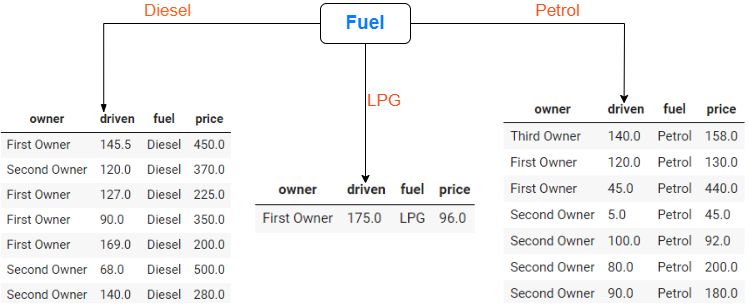

In [ ]:
from IPython.display import Image
Image('/content/tree.png')

Tiếp theo ta lại lặp lại các bước tìm variance deviation reduction như trên lần lượt tại các nhánh dưới: driven Diesel, driven LPG, driven Petrol và tiếp tục phân nhánh cây cho đến khi hội tụ hoặc đạt điều kiện dừng, sau đó cắt tỉa theo thuật toán và có được cây hồi quy hoàn chỉnh.


### 1.3. Hyperparameter của decision tree
+ **max_features:** Có nghĩa là số lượng đặc trưng cần xét đến tại mỗi node của cây khi tìm kiếm sự phân chia tốt nhất. Đối với decision tree model, chúng ta thường sử dụng tất cả các đặc trưng để xây dựng cây. Vì vậy hyperparameter này được sử dụng để xét số lượng đặc trưng tối đa cần xét tại mỗi nốt. Thông thường sẽ có các thiết lập sau
 + Nếu None thì sẽ lấy toàn bộ features trong dataset
 + Nếu là int thì sẽ lấy features tương ứng
 + Nếu là float trong [0,1] thì sẽ lấy tỉ lệ tương ứng với features trong dataset
 + Nếu sqrt thì sẽ lấy căn bậc hai số features trong dataset
 + Nếu log2 thì sẽ lấy log2 features trong dataset
+ max_depth: Độ sâu tối đa của cây được xây dựng. Trong thuật toán của decision tree, nếu ta tiếp tục phân chia các node chưa tinh khiết (purity) thì ta sẽ xây dựng được một cây mà mọi điểm trong dataset đều được dự đoán đúng. Từ đó dẫn tới cây sẽ rất phức tạp và có khả năng dẫn đến overfit. Vì vậy tham số này được xem như là điều kiện của của quá trình xây dựng cây. Thông thường sẽ có các thiết lập sau
 + Nếu là int thì sẽ lấy độ sâu tối đa của cây tương ứng
 + Nếu None thì sẽ tất cả các lá sẽ được mở rộng cho đến khi tất cả các lá chứa ít hơn min_samples_split samples.
+ min_samples_split: Số samples tối thiểu để tiếp tục chia nốt. Hyperparameter này có tác dụng tương tự với max_dept. Thông thường sẽ có các thiết lập sau:
 + Nếu là int thì giá trị min_samples_split tương ứng
 + Nếu là float trong [0,1] thì sẽ lấy tỉ lệ tương ứng với samples trong dataset
+ min_samples_leaf: Số lượng samples yêu cầu tối thiểu để là một node lá. Tác dụng tương tự với max_dept. THông thường cáo các thiết lập sau:
 + Nếu là int thì giá trị min_samples_leaf tương ứng
 + Nếu là float trong [0,1] thì sẽ lấy tỉ lệ tương ứng với samples trong dataset
+ criterion: Là hàm dùng để đo lường chất lượng cho features được chọn để chia
 + squared_error
 + absolute_error
 + poisson

### 1.4 Ưu nhược điểm của decision tree

- Ưu điểm:
    - Mô hình dễ hiểu
    - Cần ít dữ liệu để huấn luyện.
- Nhược điểm:
    - Không đảm bảo xây dựng được cây tối ưu.
    - Có thể overfitting

## 2. Random Forest

### 2.1. Random Forest là gì (ý tưởng, khái niệm)
<!-- Như đã giới thiệu ở mục 1, decision tree là một công cụ hỗ trợ quyết định. Tuy nhiên quyết định này chỉ được dựa vào bởi một đối tượng duy nhất nên tính đúng đắn sẽ không được đảm bảo. Vì vậy  -->



### 2.2. Cách xây dựng Random Forest

#### Visualize trees

In [ ]:
!pip install dtreeviz

     |████████████████████████████████| 62 kB 612 kB/s 
  Created wheel for dtreeviz: filename=dtreeviz-1.3.2-py3-none-any.whl size=67936 sha256=337385ab35677335b98f5e068effd3c9fa08a5444405e26f3666a8ecd01da295
  Stored in directory: /root/.cache/pip/wheels/9d/29/a1/f2ad20de79875e749330d5c6234fc5f517991fcaa23d7a3d0f
Successfully built dtreeviz


In [ ]:
from sklearn import tree
from dtreeviz.trees import dtreeviz # tree visualization
from matplotlib import pyplot as plt

In [ ]:
X = data[:,:-1]
y = data[:,-1]

In [ ]:
rf = RandomForestRegressor(n_estimators=100, max_depth=3)
rf.fit(X, y)

RandomForestRegressor(max_depth=3)

In [ ]:
viz = dtreeviz(rf.estimators_[0], X, y, feature_names=df.columns, target_name="Target")
viz

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


In [ ]:
viz = dtreeviz(rf.estimators_[1], X, y, feature_names=df.columns, target_name="Target")
viz


### 2.3. Hyperparameter của Random Forest

+ **n_estimators**: Số lượng cây trong mô hình random forest. Ở một mức độ nhất định, khi số lượng cây tăng lên thì kết quả sẽ tốt hơn. Tuy nhiên, sau một số thời điểm, việc tăng số lượng cây có thể sẽ không cải thiện mô hình. Số cây càng lớn đồng nghĩa với việc mô hình sẽ càng tốn thời gian chạy.
+ **bootstrap**: Có sử dụng kĩ thuật bootstraping trong quá trình xây dựng cây hay không. Nếu không thì toàn bộ dataset sẽ được chọn để xây dựng cây

![Bootstrapping](https://miro.medium.com/max/551/1*SfHes0xaGHVeUorVdkR8XQ.png)

+ **max_features:** Có nghĩa là số lượng đặc trưng cần xét đến tại mỗi node của cây khi tìm kiếm sự phân chia tốt nhất. Đối với decision tree model, chúng ta thường sử dụng tất cả các đặc trưng để xây dựng cây. Tuy nhiên với cây được xây dựng trong random forest model, thì ta chỉ lấy tập hợp con của tổng các feature ở trên để xây dựng cây. Vì vậy hyperparameter này được sử dụng để xét số lượng đặc trưng tối đa cần xét tại mỗi nốt. Thông thường sẽ có các thiết lập sau
 + Nếu None thì sẽ lấy toàn bộ features trong dataset
 + Nếu là int thì sẽ lấy features tương ứng
 + Nếu là float trong [0,1] thì sẽ lấy tỉ lệ tương ứng với features trong dataset
 + Nếu sqrt thì sẽ lấy căn bậc hai số features trong dataset
 + Nếu log2 thì sẽ lấy log2 features trong dataset

![Feature randomness](https://miro.medium.com/max/527/1*VmIM_umHWWEYCm00_B3ScQ.png)
+ **max_samples**: Số lượng mẫu (samples) khi thực hiện bootstrapping
	+ Nếu None thì sẽ lấy toàn bộ samples trong dataset
	+ Nếu là int thì sẽ lấy samples tương ứng
	+ Nếu là float trong [0,1] thì sẽ lấy tỉ lệ tương ứng với samples trong dataset

### 2.4 Ưu nhược điểm

- **Ưu điểm**
    - Một mô hình mạnh mẽ, có độ chính xác cao cho nhiều vấn đề khác nhau
    - Không yêu cầu chuẩn hóa hoặc chia tỷ lệ
    - Có thể chạy song song để tăng hiệu suất
- **Nhược điểm**
    - Yêu cầu tài nguyên tính toán lớn. Vì vậy Không thích hợp cho dữ liệu có nhiều chiều (số lượng đặc trưng lớn hơn số lượng quan sát)

## 3. Code minh họa

### Data

Link dataset: https://www.kaggle.com/nehalbirla/vehicle-dataset-from-cardekho

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
!gdown --id 1GYJ9za8RPpGam3fka4G8fh8XRno3LYOP

Downloading...
From: https://drive.google.com/uc?id=1GYJ9za8RPpGam3fka4G8fh8XRno3LYOP
To: /content/Car details v3.csv
100% 1.04M/1.04M [00:00<00:00, 32.6MB/s]


In [ ]:
df = pd.read_csv('/content/Car details v3.csv')
df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [ ]:
df.isnull().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          221
engine           221
max_power        215
torque           222
seats            221
dtype: int64

In [ ]:
df.drop(['torque', 'name'], axis=1, inplace=True)
df

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,5.0
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,5.0
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,5.0
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,5.0
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,5.0
...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,5.0
8124,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,5.0
8125,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,5.0
8126,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,5.0


In [ ]:
print(df['fuel'].unique())
print(df['seller_type'].unique())
print(df['transmission'].unique())

['Diesel' 'Petrol' 'LPG' 'CNG']
['Individual' 'Dealer' 'Trustmark Dealer']
['Manual' 'Automatic']


In [ ]:
df = pd.concat([df, pd.get_dummies(df.owner), pd.get_dummies(df.fuel), pd.get_dummies(df.seller_type), pd.get_dummies(df.transmission)], axis=1, join='inner').drop(['owner', 'fuel', 'seller_type', 'transmission'], axis=1)
df

,year,selling_price,km_driven,mileage,engine,max_power,seats,First Owner,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,CNG,Diesel,LPG,Petrol,Dealer,Individual,Trustmark Dealer,Automatic,Manual
0,2014,450000,145500,23.4 kmpl,1248 CC,74 bhp,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
1,2014,370000,120000,21.14 kmpl,1498 CC,103.52 bhp,5.0,0,0,1,0,0,0,1,0,0,0,1,0,0,1
2,2006,158000,140000,17.7 kmpl,1497 CC,78 bhp,5.0,0,0,0,0,1,0,0,0,1,0,1,0,0,1
3,2010,225000,127000,23.0 kmpl,1396 CC,90 bhp,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
4,2007,130000,120000,16.1 kmpl,1298 CC,88.2 bhp,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,18.5 kmpl,1197 CC,82.85 bhp,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1
8124,2007,135000,119000,16.8 kmpl,1493 CC,110 bhp,5.0,0,1,0,0,0,0,1,0,0,0,1,0,0,1
8125,2009,382000,120000,19.3 kmpl,1248 CC,73.9 bhp,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
8126,2013,290000,25000,23.57 kmpl,1396 CC,70 bhp,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1


In [ ]:
df['mileage'] = df['mileage'].str.split(" ").str.get(0).astype('float64')
df['engine'] = df['engine'].str.split(" ").str.get(0).astype('float64')
df['max_power'] = df['max_power'].str.split(" ").str.get(0)
df

,year,selling_price,km_driven,mileage,engine,max_power,seats,First Owner,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,CNG,Diesel,LPG,Petrol,Dealer,Individual,Trustmark Dealer,Automatic,Manual
0,2014,450000,145500,23.40,1248.0,74,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
1,2014,370000,120000,21.14,1498.0,103.52,5.0,0,0,1,0,0,0,1,0,0,0,1,0,0,1
2,2006,158000,140000,17.70,1497.0,78,5.0,0,0,0,0,1,0,0,0,1,0,1,0,0,1
3,2010,225000,127000,23.00,1396.0,90,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
4,2007,130000,120000,16.10,1298.0,88.2,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,18.50,1197.0,82.85,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1
8124,2007,135000,119000,16.80,1493.0,110,5.0,0,1,0,0,0,0,1,0,0,0,1,0,0,1
8125,2009,382000,120000,19.30,1248.0,73.9,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
8126,2013,290000,25000,23.57,1396.0,70,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1


In [ ]:
df.max_power = pd.to_numeric(df.max_power, errors='coerce')
df

,year,selling_price,km_driven,mileage,engine,max_power,seats,First Owner,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,CNG,Diesel,LPG,Petrol,Dealer,Individual,Trustmark Dealer,Automatic,Manual
0,2014,450000,145500,23.40,1248.0,74.00,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
1,2014,370000,120000,21.14,1498.0,103.52,5.0,0,0,1,0,0,0,1,0,0,0,1,0,0,1
2,2006,158000,140000,17.70,1497.0,78.00,5.0,0,0,0,0,1,0,0,0,1,0,1,0,0,1
3,2010,225000,127000,23.00,1396.0,90.00,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
4,2007,130000,120000,16.10,1298.0,88.20,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,18.50,1197.0,82.85,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1
8124,2007,135000,119000,16.80,1493.0,110.00,5.0,0,1,0,0,0,0,1,0,0,0,1,0,0,1
8125,2009,382000,120000,19.30,1248.0,73.90,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1
8126,2013,290000,25000,23.57,1396.0,70.00,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1


In [ ]:
df.insert(len(df.columns)-1, 'selling_price', df.pop('selling_price'))
df

,year,km_driven,mileage,engine,max_power,seats,First Owner,Fourth & Above Owner,Second Owner,Test Drive Car,Third Owner,CNG,Diesel,LPG,Petrol,Dealer,Individual,Trustmark Dealer,Automatic,Manual,selling_price
0,2014,145500,23.40,1248.0,74.00,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,450000
1,2014,120000,21.14,1498.0,103.52,5.0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,370000
2,2006,140000,17.70,1497.0,78.00,5.0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,158000
3,2010,127000,23.00,1396.0,90.00,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,225000
4,2007,120000,16.10,1298.0,88.20,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,130000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,110000,18.50,1197.0,82.85,5.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,320000
8124,2007,119000,16.80,1493.0,110.00,5.0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,135000
8125,2009,120000,19.30,1248.0,73.90,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,382000
8126,2013,25000,23.57,1396.0,70.00,5.0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,290000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   year                  8128 non-null   int64  
 1   km_driven             8128 non-null   int64  
 2   mileage               7907 non-null   float64
 3   engine                7907 non-null   float64
 4   max_power             7912 non-null   float64
 5   seats                 7907 non-null   float64
 6   First Owner           8128 non-null   uint8  
 7   Fourth & Above Owner  8128 non-null   uint8  
 8   Second Owner          8128 non-null   uint8  
 9   Test Drive Car        8128 non-null   uint8  
 10  Third Owner           8128 non-null   uint8  
 11  CNG                   8128 non-null   uint8  
 12  Diesel                8128 non-null   uint8  
 13  LPG                   8128 non-null   uint8  
 14  Petrol                8128 non-null   uint8  
 15  Dealer               

In [ ]:
df.isnull().sum()

year                      0
km_driven                 0
mileage                 221
engine                  221
max_power               216
seats                   221
First Owner               0
Fourth & Above Owner      0
Second Owner              0
Test Drive Car            0
Third Owner               0
CNG                       0
Diesel                    0
LPG                       0
Petrol                    0
Dealer                    0
Individual                0
Trustmark Dealer          0
Automatic                 0
Manual                    0
selling_price             0
dtype: int64

### Process missing values

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [ ]:
new_data = df.copy()
model = IterativeImputer()
data = model.fit_transform(new_data)

In [ ]:
print(np.isnan(np.sum(data)))
print(data.shape)

False
(8128, 21)


In [ ]:
data

array([[2.014e+03, 1.455e+05, 2.340e+01, ..., 0.000e+00, 1.000e+00,
        4.500e+05],
       [2.014e+03, 1.200e+05, 2.114e+01, ..., 0.000e+00, 1.000e+00,
        3.700e+05],
       [2.006e+03, 1.400e+05, 1.770e+01, ..., 0.000e+00, 1.000e+00,
        1.580e+05],
       ...,
       [2.009e+03, 1.200e+05, 1.930e+01, ..., 0.000e+00, 1.000e+00,
        3.820e+05],
       [2.013e+03, 2.500e+04, 2.357e+01, ..., 0.000e+00, 1.000e+00,
        2.900e+05],
       [2.013e+03, 2.500e+04, 2.357e+01, ..., 0.000e+00, 1.000e+00,
        2.900e+05]])

### Train regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold

In [ ]:
def run_rf(X_train, y_train, X_test, y_test):
    model = RandomForestRegressor()
    model.fit(X_train, y_train)
    return (model, model.score(X_test, y_test))

In [ ]:
def run(data, k=5):
    X = data[:,:-1]
    y = data[:,-1]
    kf = KFold(n_splits=k, shuffle=True)
    rf = []
    for train_index , test_index in kf.split(X):
        X_train , X_test = X[train_index,:], X[test_index,:]
        y_train , y_test = y[train_index], y[test_index]
        rf.append(run_rf(X_train, y_train, X_test, y_test)[1])
        
    print(rf)
    print(sum(rf)/len(rf))
    return sum(rf)/len(rf)

In [ ]:
result={}
result['Random forest regressor'] = run(data)
table =pd.DataFrame.from_dict(result, orient='index',columns=['Accuracy'])
table

[0.9500764240923227, 0.9646804401674477, 0.9636264469030009, 0.9728771594380181, 0.9726757221875605]
0.9647872385576699


,Accuracy
Random forest regressor,0.964787


### Tuning hyperparameters

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
import random
def GridSearchSVM_WithData(data):
  X = data[:,:-1]
  y = data[:,-1]

  model = RandomForestRegressor()
  # criterion = ['squared_error', 'absolute_error','poisson']  
  # tmp = [random.randint(0,data.shape[1]-1) for i in range(5)]
  # max_features = ['sqrt','log2','auto',*tmp]
  # n_estimators = [10,100,200,300]
  param_grid = {  'bootstrap': [True], 'max_depth': [5, 10, None], 'max_features': ['auto', 'log2','sqrt'], 'n_estimators': [10,100,200,300]}

  # define grid search
  grid_search = GridSearchCV(estimator = model, param_grid = param_grid, cv = 5, n_jobs = 1, verbose = 3)
  grid_result = grid_search.fit(X, y)
  # summarize results
  print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

In [ ]:
GridSearchSVM_WithData(data)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=10;, score=0.926 total time=   0.2s
[CV 2/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=10;, score=0.925 total time=   0.2s
[CV 3/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=10;, score=0.944 total time=   0.1s
[CV 4/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=10;, score=0.919 total time=   0.2s
[CV 5/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=10;, score=0.921 total time=   0.2s
[CV 1/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=100;, score=0.938 total time=   2.0s
[CV 2/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=100;, score=0.932 total time=   1.7s
[CV 3/5] END bootstrap=True, max_depth=5, max_features=auto, n_estimators=100;, score=0.951 total time=   1.9s
[CV 4/5] END bootstrap=True, max_depth=5, max_features=

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn import model_selection
import matplotlib.pyplot as plt

In [ ]:
def compare_linear_model(data):
  X = data[:,:-1]
  y = data[:,-1]
  models = []
  models.append(('Linear Regression', LinearRegression()))
  models.append(('DecisionTree Regression', DecisionTreeRegressor()))
  models.append(('RandomForest Regression',RandomForestRegressor()))
  models.append(('Bayesian Regression',BayesianRidge()))
  models.append(('Knn Algorithm',KNeighborsRegressor()))
  
  # evaluate each model in turn
  result = {}
  scoring = 'accuracy'
  for name, model in models:
    kfold = model_selection.KFold(n_splits=5, shuffle=True)
    cv_results = model_selection.cross_val_score(model, X, y, cv=kfold)
    result[name] = cv_results.mean()
  return result

In [ ]:
result = compare_linear_model(data)
table =pd.DataFrame.from_dict(result, orient='index',columns=['Accuracy'])
table

,Accuracy
Linear Regression,0.672605
DecisionTree Regression,0.951362
RandomForest Regression,0.968383
Bayesian Regression,0.672962
Knn Algorithm,0.804449
